In [3]:
import os
import rasterio

In [4]:
# Usage
base_directory = "./data/SEN12FLOOD"
# total_bytes = compute_total_memory_footprint(base_directory)

# print(f"Total memory footprint: {total_bytes / (1024 * 1024):.2f} MB")

In [5]:
# If you want only files (and not subdirectories):
file_names = [f for f in os.listdir(base_directory) if os.path.isfile(os.path.join(base_directory, f))]
# List all subdirectories in the given directory
dir_names = [d for d in os.listdir(base_directory) if os.path.isdir(os.path.join(base_directory, d))]

In [6]:
print(file_names)
print(dir_names)
len(dir_names)

['.directory', 'new.tif.aux.xml', 'S1list.json', 'S2list.json', 'new.tif']
['61', '0184', '0170', '0148', '59', '0177', '66', '0141', '50', '57', '0146', '0320', '0327', '0115', '0318', '0311', '0123', '32', '35', '0124', '0316', '0329', '0178', '0147', '56', '51', '0140', '58', '0149', '67', '0182', '0176', '0171', '60', '0125', '34', '0328', '33', '0122', '0310', '0326', '0319', '0321', '0298', '0095', '0253', '0061', '0059', '0066', '0254', '0050', '0262', '0296', '0068', '0057', '0231', '0236', '0004', '0209', '0200', '0035', '0207', '0238', '0069', '0290', '0263', '0093', '0255', '0067', '0299', '0060', '0094', '0206', '0034', '0033', '0201', '0005', '0208', '0230', '0020', '0212', '0018', '0215', '0027', '0223', '0011', '0029', '0042', '0089', '0045', '0277', '0248', '0073', '0241', '0246', '0074', '0080', '0279', '0028', '0225', '0010', '0222', '0026', '0214', '0213', '0021', '0081', '0075', '0247', '0278', '0240', '0072', '0086', '0276', '0044', '0282', '0249', '0285', '0043', 

335

In [34]:
import numpy as np
import pandas as pd
from affine import Affine

columns = ["Directory", "FileName", "Compatible", "Width", "Height", "Num_Bands", "CRS", "Affine_Transform", "Metadata"]
df = pd.DataFrame(columns=columns)

exceptions = []

for dir_name in os.listdir(base_directory):
    dir_path = os.path.join(base_directory, dir_name)
    
    # Check if it's a directory (and not a file or other type of entity)
    if os.path.isdir(dir_path):
        
        # Loop through files in the directory
        for file_name in os.listdir(dir_path):
            file_path = os.path.join(dir_path, file_name)
            
            # Check if it's a file (and not a sub-directory or other type of entity)
            if os.path.isfile(file_path):
                row = {"Directory": dir_name, "FileName": file_name, "Compatible": 0}
                try:
                    with rasterio.open(file_path) as src:
                        row["Compatible"] = 1
                        row["Width"] = src.width
                        row["Height"] = src.height
                        row["Num_Bands"] = src.count
                        row["CRS"] = src.crs
                        row["Affine_Transform"] = src.transform
                        row["Metadata"] = src.tags()
                except rasterio.errors.RasterioIOError as e:
                    print(e)
                    exceptions.append(e)
                new_record = pd.DataFrame([row])
                df = pd.concat([df, new_record], ignore_index=True)

'./SEN12FLOOD/0004/B03_series.tif.aux.xml' not recognized as a supported file format.
'./SEN12FLOOD/0206/B06_series.tif.aux.xml' not recognized as a supported file format.
'./SEN12FLOOD/0034/infosS2.json' not recognized as a supported file format.
'./SEN12FLOOD/0033/infosS2.json' not recognized as a supported file format.


/Users/emily/miniforge3/envs/ML/lib/python3.10/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


'./SEN12FLOOD/0027/S1B_IW_GRDH_1SDV_20181213T161955_20181213T162020_014025_01A082_DE5F_corrected_VH.tif.aux.xml' not recognized as a supported file format.
'./SEN12FLOOD/0073/infosS2.json' not recognized as a supported file format.
'./SEN12FLOOD/0074/wget-log' not recognized as a supported file format.


/Users/emily/miniforge3/envs/ML/lib/python3.10/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


'./SEN12FLOOD/0088/.directory' not recognized as a supported file format.
'./SEN12FLOOD/29/S2_2019-02-14_B12.tif' not recognized as a supported file format.
'./SEN12FLOOD/0106/.directory' not recognized as a supported file format.
'./SEN12FLOOD/0127/.directory' not recognized as a supported file format.


/Users/emily/miniforge3/envs/ML/lib/python3.10/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


'./SEN12FLOOD/0001/.directory' not recognized as a supported file format.
'./SEN12FLOOD/0063/infosS2.json' not recognized as a supported file format.


/Users/emily/miniforge3/envs/ML/lib/python3.10/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


'./SEN12FLOOD/0159/wget-log' not recognized as a supported file format.


/Users/emily/miniforge3/envs/ML/lib/python3.10/site-packages/rasterio/__init__.py:304: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  dataset = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


KeyError: False

In [36]:
raster_data = df[df["Compatible"] == 1]
raster_data = raster_data.drop(columns = ["Compatible"])
print(df.head())
print(raster_data.head())
print(len(df))
print(len(raster_data))

  Directory                                           FileName Compatible  \
0        61  S1A_IW_GRDH_1SDV_20190223T031705_20190223T0317...          1   
1        61                              S2_2019-04-04_B06.tif          1   
2        61                              S2_2019-04-14_B12.tif          1   
3        61                              S2_2019-04-14_B06.tif          1   
4        61                              S2_2019-04-04_B12.tif          1   

  Width Height Num_Bands     CRS  \
0   548    518         1  (init)   
1   256    256         1  (init)   
2   256    256         1  (init)   
3   256    256         1  (init)   
4   256    256         1  (init)   

                               Affine_Transformation  \
0  (8.983152841195215e-05, 0.0, 32.67141190805505...   
1  (20.0, 0.0, 465620.0, 0.0, -20.0, 7799380.0, 0...   
2  (20.0, 0.0, 465620.0, 0.0, -20.0, 7799380.0, 0...   
3  (20.0, 0.0, 465620.0, 0.0, -20.0, 7799380.0, 0...   
4  (20.0, 0.0, 465620.0, 0.0, -20.0, 779

In [43]:
raster_data = raster_data.rename(columns={"Affine_Transformation": "Affine_Transform"})

In [44]:
from shapely.geometry import Point

def get_center_point(row):
    # Extract the height and width from the row
    height, width = row['Height'], row['Width']

    # Calculate the center pixel coordinates
    center_row, center_col = height / 2, width / 2

    # Apply the affine transform to get the geographic coordinates
    x, y = row['Affine_Transform'] * (center_col, center_row)

    # Return the Point geometry
    return Point(x, y)

# Apply the function to each row of the DataFrame
raster_data['Center_Point'] = raster_data.apply(get_center_point, axis=1)

In [45]:
raster_data

,Directory,FileName,Width,Height,Num_Bands,CRS,Affine_Transform,Metadata,Center_Point
0,61,S1A_IW_GRDH_1SDV_20190223T031705_20190223T0317...,548,518,1,(init),"(8.983152841195215e-05, 0.0, 32.67141190805505...","{'AREA_OR_POINT': 'Area', 'TIFFTAG_IMAGEDESCRI...",POINT (32.69602574683992 -19.92468683534468)
1,61,S2_2019-04-04_B06.tif,256,256,1,(init),"(20.0, 0.0, 465620.0, 0.0, -20.0, 7799380.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (468180 7796820)
2,61,S2_2019-04-14_B12.tif,256,256,1,(init),"(20.0, 0.0, 465620.0, 0.0, -20.0, 7799380.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (468180 7796820)
3,61,S2_2019-04-14_B06.tif,256,256,1,(init),"(20.0, 0.0, 465620.0, 0.0, -20.0, 7799380.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (468180 7796820)
4,61,S2_2019-04-04_B12.tif,256,256,1,(init),"(20.0, 0.0, 465620.0, 0.0, -20.0, 7799380.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (468180 7796820)
...,...,...,...,...,...,...,...,...,...
36114,25,S2_2019-05-20_B03.tif,512,512,1,(init),"(10.0, 0.0, 274660.0, 0.0, -10.0, 4104960.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (277220 4102400)
36115,25,S2_2019-05-20_B01.tif,85,85,1,(init),"(60.0, 0.0, 274620.0, 0.0, -60.0, 4104960.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (277170 4102410)
36116,25,S1A_IW_GRDH_1SDV_20190410T141953_20190410T1420...,659,528,1,(init),"(8.983152841195215e-05, 0.0, 54.46548816868955...","{'AREA_OR_POINT': 'Area', 'TIFFTAG_IMAGEDESCRI...",POINT (54.49508765730128 37.0413954080868)
36117,25,S2_2019-04-10_B02.tif,512,512,1,(init),"(10.0, 0.0, 274660.0, 0.0, -10.0, 4104960.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (277220 4102400)


In [75]:
raster_data["CRS_string"] = raster_data["CRS"].astype(str)
grouped = raster_data.groupby("CRS_string")
gdfs = []
for crs, group_data in grouped:
    if crs != "None":
        gdf = gpd.GeoDataFrame(group_data, geometry='Center_Point', crs=crs)
        gdfs.append(gdf)
print([len(gdf) for gdf in gdfs])

[108, 2100, 1343, 7128, 288, 216, 540, 1428, 9636, 2040, 2016, 9208]


In [86]:
import geopandas as gpd
from shapely.geometry import Point
import folium
from folium.plugins import MarkerCluster

all_lats, all_lons = [], []

for gdf in gdfs:  # Assuming you have all your GeoDataFrames in a list
    gdf_wgs84 = gdf.to_crs("EPSG:4326")
    all_lats.extend(gdf_wgs84.geometry.y.tolist())
    all_lons.extend(gdf_wgs84.geometry.x.tolist())

mean_lat, mean_lon = sum(all_lats) / len(all_lats), sum(all_lons) / len(all_lons)
print(f'Mean Lat {mean_lat}, Mean Lon {mean_lon}')

# Initialize map
m = folium.Map(location=[mean_lat, mean_lon], zoom_start=6)  # Adjust zoom_start as necessary


# Iterate over each GeoDataFrame and plot on map
for gdf in gdfs:
    gdf_wgs84 = gdf.to_crs("EPSG:4326")
    
    # Using clustering to group close points
    cluster = MarkerCluster().add_to(m)
    
    for idx, row in gdf_wgs84.iterrows():
        folium.Marker([row['Center_Point'].y, row['Center_Point'].x]).add_to(cluster)

# Display the map
m

Mean Lat -1.259437854737454, Mean Lon 43.082044068251754


In [93]:
import rasterio
from rasterio.enums import Resampling

def resize_sentinel_image(file_path, output_path, target_size=(224, 224)):
    with rasterio.open(file_path) as src:
        # Calculate the new shape based on the aspect ratio
        width, height = target_size
        transform = src.transform
        transform = transform * transform.translation(-transform.c, -transform.f) * transform.scale(src.width / width, src.height / height)

        # Perform the resize operation
        data = src.read(
            out_shape=(src.count, height, width),
            resampling=Resampling.bilinear
        )
        print(data)

        # Update metadata
        metadata = src.meta.copy()
        metadata.update({
            "driver": "GTiff",
            "height": height,
            "width": width,
            "transform": transform
        })

        # Save the resized image
        with rasterio.open(output_path, 'w', **metadata) as dst:
            dst.write(data)

# Example usage:
resize_sentinel_image(f"{base_directory}/0033/S1B_IW_GRDH_1SDV_20190204T162344_20190204T162409_014798_01B9C3_2E35_corrected_VV.tif", "test.tif")


[[[0.16519994 0.09445933 0.10024108 ... 0.16551875 0.18796407 0.15060344]
  [0.18330877 0.1164413  0.11874123 ... 0.15854333 0.16037406 0.09628169]
  [0.07923608 0.08489356 0.09964899 ... 0.09494361 0.09326066 0.0600404 ]
  ...
  [0.2113789  0.24084118 0.15663148 ... 0.07712842 0.10823948 0.07912509]
  [0.15833098 0.19197212 0.17003843 ... 0.10744566 0.10011675 0.07597388]
  [0.15612017 0.24588995 0.31087378 ... 0.10448599 0.08970104 0.06096387]]]


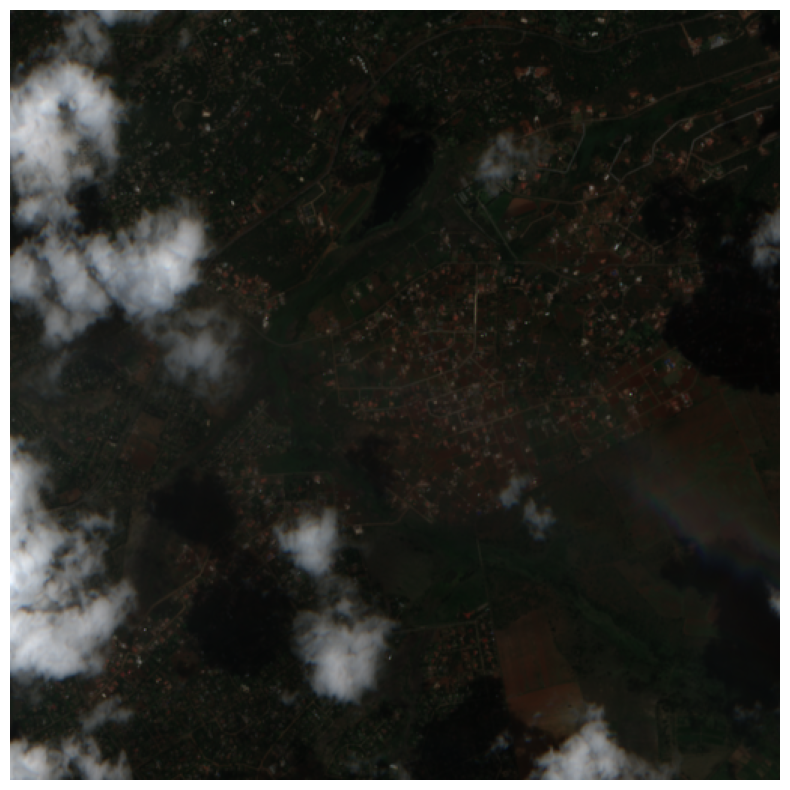

In [94]:
import matplotlib.pyplot as plt

# Load the bands into separate variables
with rasterio.open(f'{base_directory}/0033/S2_2018-12-28_B02.tif') as src:
    blue = src.read(1)
    
with rasterio.open(f'{base_directory}/0033/S2_2018-12-28_B03.tif') as src:
    green = src.read(1)
    
with rasterio.open(f'{base_directory}/0033/S2_2018-12-28_B04.tif') as src:
    red = src.read(1)

# Stack the bands (note the order: red, green, blue)
rgb = np.stack((red, green, blue), axis=-1)

# Normalize the data to range [0, 1] for display
rgb = rgb / np.max(rgb)

# Plotting the RGB image
plt.figure(figsize=(10,10))
plt.imshow(rgb)
plt.axis('off')  # Don't show axis numbers
plt.show()


In [95]:
red_data = raster_data[raster_data['FileName'].str.endswith('B04.tif')]
green_data = raster_data[raster_data['FileName'].str.endswith('B03.tif')]
blue_data = raster_data[raster_data['FileName'].str.endswith('B02.tif')]

In [175]:
red_data = red_data.sort_values(by=['Directory', 'FileName'])
red_data = red_data.reset_index(drop=True)
red_data

,Directory,FileName,Width,Height,Num_Bands,CRS,Affine_Transform,Metadata,Center_Point,CRS_string
0,0,S2_2019-01-26_B04.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
1,0,S2_2019-01-31_B04.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
2,0,S2_2019-02-10_B04.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
3,0,S2_2019-02-25_B04.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
4,0,S2_2019-03-12_B04.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
...,...,...,...,...,...,...,...,...,...,...
2232,9,S2_2018-12-17_B04.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736
2233,9,S2_2018-12-27_B04.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736
2234,9,S2_2019-01-24_B04.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736
2235,9,S2_2019-01-31_B04.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736


In [176]:
green_data = green_data.sort_values(by=['Directory', 'FileName'])
green_data = green_data.reset_index(drop=True)
green_data

,Directory,FileName,Width,Height,Num_Bands,CRS,Affine_Transform,Metadata,Center_Point,CRS_string
0,0,S2_2019-01-26_B03.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
1,0,S2_2019-01-31_B03.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
2,0,S2_2019-02-10_B03.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
3,0,S2_2019-02-25_B03.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
4,0,S2_2019-03-12_B03.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
...,...,...,...,...,...,...,...,...,...,...
2232,9,S2_2018-12-17_B03.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736
2233,9,S2_2018-12-27_B03.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736
2234,9,S2_2019-01-24_B03.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736
2235,9,S2_2019-01-31_B03.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736


In [177]:
blue_data = blue_data.sort_values(by=['Directory', 'FileName'])
blue_data = blue_data.reset_index(drop=True)
blue_data

,Directory,FileName,Width,Height,Num_Bands,CRS,Affine_Transform,Metadata,Center_Point,CRS_string
0,0,S2_2019-01-26_B02.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
1,0,S2_2019-01-31_B02.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
2,0,S2_2019-02-10_B02.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
3,0,S2_2019-02-25_B02.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
4,0,S2_2019-03-12_B02.tif,512,512,1,(init),"(10.0, 0.0, 689860.0, 0.0, -10.0, 7822850.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (692420 7820290),EPSG:32736
...,...,...,...,...,...,...,...,...,...,...
2232,9,S2_2018-12-17_B02.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736
2233,9,S2_2018-12-27_B02.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736
2234,9,S2_2019-01-24_B02.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736
2235,9,S2_2019-01-31_B02.tif,512,512,1,(init),"(10.0, 0.0, 455700.0, 0.0, -10.0, 7149570.0, 0...",{'AREA_OR_POINT': 'Area'},POINT (458260 7147010),EPSG:32736


In [178]:
# List to store processed RGB images
rgb_images = []

# Iterate over rows in the red_data dataframe
for row in red_data.itertuples():
    red_filename = getattr(row, 'FileName')
    directory = getattr(row, 'Directory')

    # Construct the full paths
    red_path = f'{base_directory}/{directory}/{red_filename}'
    green_path = red_path.replace('B04.tif', 'B03.tif')
    blue_path = red_path.replace('B04.tif', 'B02.tif')
    
    # Read bands
    with rasterio.open(red_path) as src:
        red_band = src.read(1)
    with rasterio.open(green_path) as src:
        green_band = src.read(1)
    with rasterio.open(blue_path) as src:
        blue_band = src.read(1)
    
    # Stack bands to make RGB image
    rgb = np.stack((red_band, green_band, blue_band), axis=-1)
    rgb_images.append(rgb)

# Convert list of arrays to a single numpy array
rgb_images_np = np.array(rgb_images)

In [179]:
with rasterio.open(f"{base_directory}/61/S2_2019-04-14_B02.tif") as src:
    bit_depth = src.dtypes[0]

print(bit_depth)

uint16


In [180]:
def average_statistics(np_array):
    print("Average Statistics Across All Images:")
    
    for channel, color in enumerate(['Red', 'Green', 'Blue']):
        channel_data = np_array[:, :, :, channel]
        
        min_value = np.min(channel_data)
        max_value = np.max(channel_data)
        mean_value = np.mean(channel_data)
        std_dev = np.std(channel_data)

        print(f"{color} Channel:")
        print(f"  Min Value: {min_value}")
        print(f"  Max Value: {max_value}")
        print(f"  Mean Value: {mean_value}")
        print(f"  Standard Deviation: {std_dev}")
    
    print("------")

average_statistics(rgb_images_np)

Average Statistics Across All Images:
Red Channel:
  Min Value: 0
  Max Value: 19920
  Mean Value: 1192.1605855117273
  Standard Deviation: 1286.4630392121383
Green Channel:
  Min Value: 0
  Max Value: 19760
  Mean Value: 1128.1709830122545
  Standard Deviation: 1239.479147175343
Blue Channel:
  Min Value: 0
  Max Value: 21696
  Mean Value: 881.2434369079972
  Standard Deviation: 1273.4880533579408
------


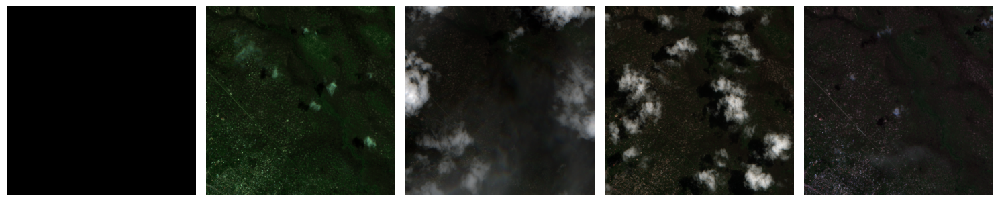

In [181]:
from skimage import exposure

def hist_equalize(im):
    # Equalize the histogram
    img_cdf, bin_centers = exposure.cumulative_distribution(im)
    return exposure.rescale_intensity(im, out_range='uint8')

def equalize_rgb_image(rgb_image):
    # Split the channels
    red_channel, green_channel, blue_channel = rgb_image[:,:,0], rgb_image[:,:,1], rgb_image[:,:,2]
    
    # Equalize each channel
    red_equalized = hist_equalize(red_channel)
    green_equalized = hist_equalize(green_channel)
    blue_equalized = hist_equalize(blue_channel)
    
    # Stack them back into an RGB image
    equalized_image = np.stack([red_equalized, green_equalized, blue_equalized], axis=-1)
    
    return equalized_image

# Number of images to display
n_images = 5

# Create a figure with a grid of subplots
fig, axs = plt.subplots(1, n_images, figsize=(15, 5))

for i in range(n_images):
    equalized_image = equalize_rgb_image(rgb_images_np[i])  
    axs[i].imshow(equalized_image)
    axs[i].axis('off')  # To hide axes

plt.tight_layout()
plt.show()

In [182]:
rgb_images_np.shape

(2237, 512, 512, 3)

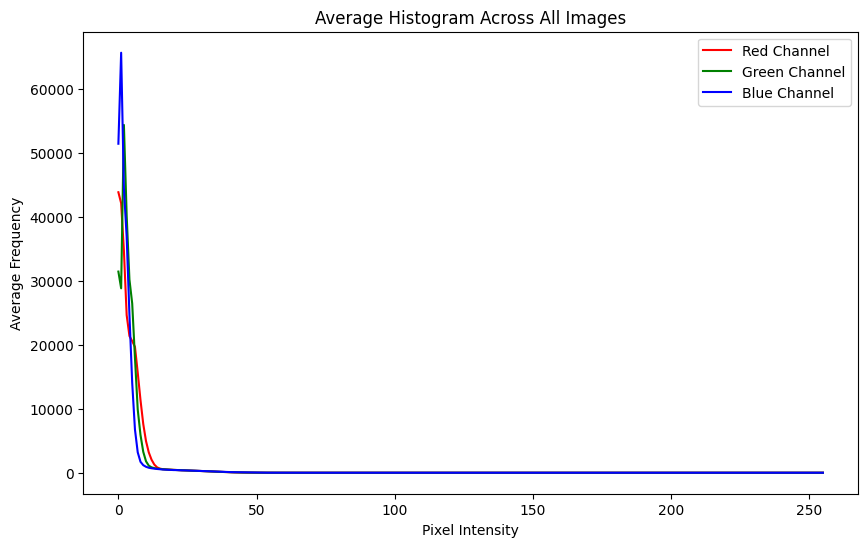

In [136]:
def compute_histogram_rgb(image, bins=256):
    # For each channel, compute histogram and return all three histograms
    red_hist = np.histogram(image[..., 0], bins=bins, range=(0, 65536))[0]
    green_hist = np.histogram(image[..., 1], bins=bins, range=(0, 65536))[0]
    blue_hist = np.histogram(image[..., 2], bins=bins, range=(0, 65536))[0]
    
    return red_hist, green_hist, blue_hist

# Assuming `images` is a list of your RGB image arrays
red_histograms = []
green_histograms = []
blue_histograms = []

for image in rgb_images_np:
    red_hist, green_hist, blue_hist = compute_histogram_rgb(image)
    red_histograms.append(red_hist)
    green_histograms.append(green_hist)
    blue_histograms.append(blue_hist)

# Average histograms for each channel
average_red_histogram = np.mean(red_histograms, axis=0)
average_green_histogram = np.mean(green_histograms, axis=0)
average_blue_histogram = np.mean(blue_histograms, axis=0)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(average_red_histogram, color='red', label='Red Channel')
plt.plot(average_green_histogram, color='green', label='Green Channel')
plt.plot(average_blue_histogram, color='blue', label='Blue Channel')
plt.xlabel('Pixel Intensity')
plt.ylabel('Average Frequency')
plt.title('Average Histogram Across All Images')
plt.legend()
plt.show()

In [183]:
def equalize_rgb_image(image):
    # Equalize each channel separately
    eq_red = exposure.equalize_hist(image[:, :, 0])
    eq_green = exposure.equalize_hist(image[:, :, 1])
    eq_blue = exposure.equalize_hist(image[:, :, 2])
    
    # Stack the channels back together
    return np.stack([eq_red, eq_green, eq_blue], axis=-1)

# Apply the equalization
equalized_images = np.array([equalize_rgb_image(img) for img in rgb_images_np])
print(equalized_images[0])

[[[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 ...

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]

 [[1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]
  ...
  [1. 1. 1.]
  [1. 1. 1.]
  [1. 1. 1.]]]


In [188]:
def average_statistics(np_array):
    print("Average Statistics Across All Images:")
    
    for channel, color in enumerate(['Red', 'Green', 'Blue']):
        channel_data = np_array[:, :, :, channel]
        
        min_value = np.min(channel_data)
        max_value = np.max(channel_data)
        mean_value = np.mean(channel_data)
        std_dev = np.std(channel_data)

        print(f"{color} Channel:")
        print(f"  Min Value: {min_value}")
        print(f"  Max Value: {max_value}")
        print(f"  Mean Value: {mean_value}")
        print(f"  Standard Deviation: {std_dev}")
    
    print("------")

average_statistics(equalized_images)

Average Statistics Across All Images:
Red Channel:
  Min Value: 3.814697265625e-06
  Max Value: 1.0
  Mean Value: 0.5533376363539494
  Standard Deviation: 0.31132010873021526
Green Channel:
  Min Value: 3.814697265625e-06
  Max Value: 1.0
  Mean Value: 0.5534772148127148
  Standard Deviation: 0.31131940265843727
Blue Channel:
  Min Value: 3.814697265625e-06
  Max Value: 1.0
  Mean Value: 0.5536085302669015
  Standard Deviation: 0.3112139340401487
------


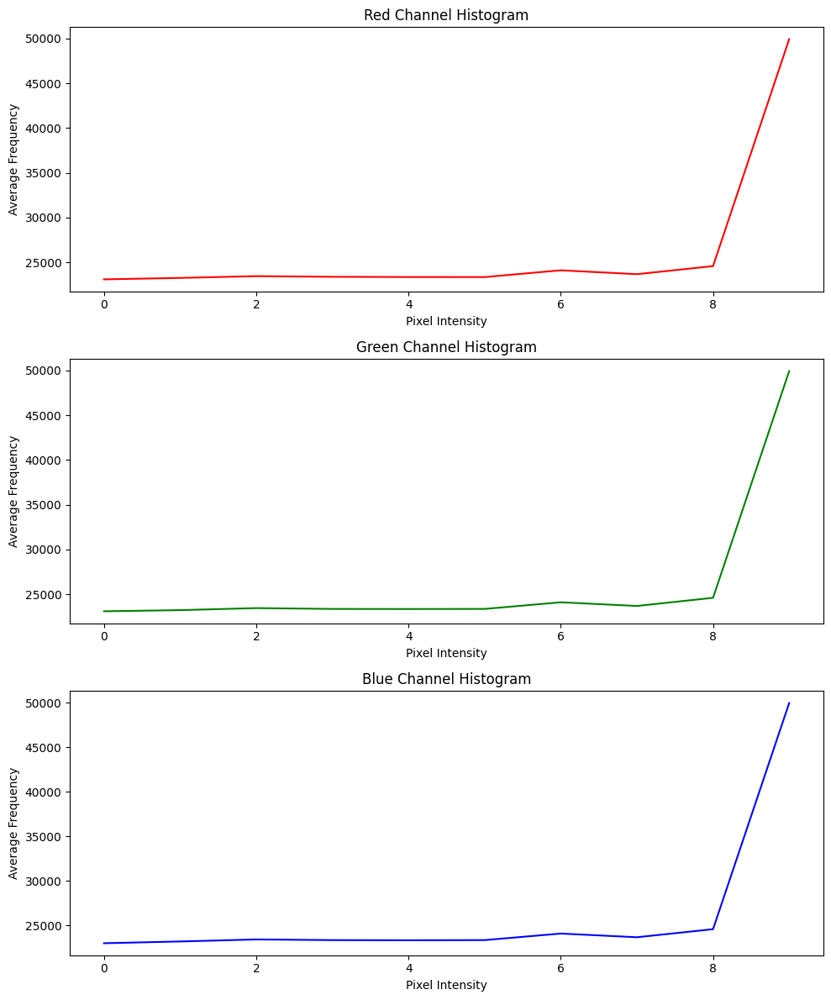

In [189]:
# Compute average histograms
def compute_rgb_histogram(image, bins=10):
    hist_r, _ = np.histogram(image[:, :, 0], bins=bins, range=(0, 1))
    hist_g, _ = np.histogram(image[:, :, 1], bins=bins, range=(0, 1))
    hist_b, _ = np.histogram(image[:, :, 2], bins=bins, range=(0, 1))
    return hist_r, hist_g, hist_b

# Get histograms for all images
histograms = np.array([compute_rgb_histogram(img) for img in equalized_images])

# Average histograms
average_histogram_r = histograms[:, 0].mean(axis=0)
average_histogram_g = histograms[:, 1].mean(axis=0)
average_histogram_b = histograms[:, 2].mean(axis=0)

fig, ax = plt.subplots(nrows=3, ncols=1, figsize=(10, 12))

# Plot Red Channel Histogram
ax[0].plot(average_histogram_r, color='red')
ax[0].set_title('Red Channel Histogram')
ax[0].set_xlabel('Pixel Intensity')
ax[0].set_ylabel('Average Frequency')

# Plot Green Channel Histogram
ax[1].plot(average_histogram_g, color='green')
ax[1].set_title('Green Channel Histogram')
ax[1].set_xlabel('Pixel Intensity')
ax[1].set_ylabel('Average Frequency')

# Plot Blue Channel Histogram
ax[2].plot(average_histogram_b, color='blue')
ax[2].set_title('Blue Channel Histogram')
ax[2].set_xlabel('Pixel Intensity')
ax[2].set_ylabel('Average Frequency')

plt.tight_layout()
plt.show()

In [190]:
def contrast_stretching(img):
    in_min = np.min(img)
    in_max = np.max(img)
    
    out_min = 0
    out_max = 65535  # Assuming 16-bit images

    # Check if the image has any variation in pixel values
    if in_max == in_min:
        return img  # Or return a stretched image with all values set to out_min
    
    stretched_img = (img - in_min) * ((out_max - out_min) / (in_max - in_min)) + out_min
    
    return stretched_img

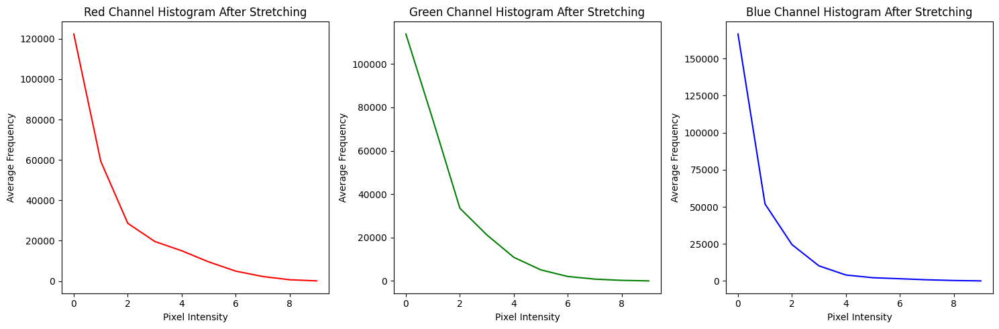

In [191]:
# Stretch each image in the dataset
stretched_images = np.array([contrast_stretching(img) for img in rgb_images_np])

def compute_histogram(image, bins=10, range=(0, 65536)):
    return np.histogram(image, bins=bins, range=range)[0]

# Compute histograms and plot them
red_histograms = [compute_histogram(img[:, :, 0], bins=10, range=(0, 65536)) for img in stretched_images]
green_histograms = [compute_histogram(img[:, :, 1], bins=10, range=(0, 65536)) for img in stretched_images]
blue_histograms = [compute_histogram(img[:, :, 2], bins=10, range=(0, 65536)) for img in stretched_images]

avg_red_histogram = np.mean(red_histograms, axis=0)
avg_green_histogram = np.mean(green_histograms, axis=0)
avg_blue_histogram = np.mean(blue_histograms, axis=0)

plt.figure(figsize=(15, 5))

# Plot Red Channel
plt.subplot(1, 3, 1)
plt.plot(avg_red_histogram, color='red')
plt.xlabel('Pixel Intensity')
plt.ylabel('Average Frequency')
plt.title('Red Channel Histogram After Stretching')

# Plot Green Channel
plt.subplot(1, 3, 2)
plt.plot(avg_green_histogram, color='green')
plt.xlabel('Pixel Intensity')
plt.ylabel('Average Frequency')
plt.title('Green Channel Histogram After Stretching')

# Plot Blue Channel
plt.subplot(1, 3, 3)
plt.plot(avg_blue_histogram, color='blue')
plt.xlabel('Pixel Intensity')
plt.ylabel('Average Frequency')
plt.title('Blue Channel Histogram After Stretching')

plt.tight_layout()
plt.show()


In [192]:
def average_statistics(np_array):
    print("Average Statistics Across All Images:")
    
    for channel, color in enumerate(['Red', 'Green', 'Blue']):
        channel_data = np_array[:, :, :, channel]
        
        min_value = np.min(channel_data)
        max_value = np.max(channel_data)
        mean_value = np.mean(channel_data)
        std_dev = np.std(channel_data)

        print(f"{color} Channel:")
        print(f"  Min Value: {min_value}")
        print(f"  Max Value: {max_value}")
        print(f"  Mean Value: {mean_value}")
        print(f"  Standard Deviation: {std_dev}")
    
    print("------")

average_statistics(stretched_images)

Average Statistics Across All Images:
Red Channel:
  Min Value: 0.0
  Max Value: 65535.00000000001
  Mean Value: 11206.158539318714
  Standard Deviation: 11212.016046523057
Green Channel:
  Min Value: 0.0
  Max Value: 65535.00000000001
  Mean Value: 10385.402860669741
  Standard Deviation: 9245.996857948276
Blue Channel:
  Min Value: 0.0
  Max Value: 65535.00000000001
  Mean Value: 7238.549373494214
  Standard Deviation: 7928.718898531305
------


In [157]:
equalized_images.shape

(2237, 512, 512, 3)

In [161]:
import json

# Load the JSON data
with open(f'{base_directory}/S2list.json', 'r') as file:
    data = json.load(file)

# Lists to hold data
directories = []
file_names = []
flooding_labels = []
dates = []
full_data_coverage_labels = []

# Iterate through the JSON structure and populate the lists
for key, value in data.items():
    directory = key
    for k, v in value.items():
        if k.isdigit():
            directories.append(directory)
            if 'filename' in v:
                file_names.append(v['filename'])
            else:
                file_names.append(None)
            flooding_labels.append(int(v['FLOODING']))
            dates.append(v['date'])
            full_data_coverage_labels.append(int(v['FULL-DATA-COVERAGE']))

# Create a pandas DataFrame
df = pd.DataFrame({
    'Directory': directories,
    'File_Name': file_names,
    'Flooding': flooding_labels,
    'Date': dates,
    'Full_Data_Coverage': full_data_coverage_labels
})

# Display the DataFrame
print(df)


     Directory      File_Name  Flooding        Date  Full_Data_Coverage
0         0063  S2_2019-02-04         0  2019-02-04                   1
1         0200  S2_2019-02-23         0  2019-02-23                   1
2         0200  S2_2019-02-28         0  2019-02-28                   1
3         0200  S2_2019-03-10         0  2019-03-10                   1
4         0200  S2_2019-03-25         1  2019-03-25                   1
...        ...            ...       ...         ...                 ...
3126        29  S2_2019-01-05         0  2019-01-05                   1
3127        29  S2_2019-01-10         0  2019-01-10                   1
3128        29  S2_2019-01-30         0  2019-01-30                   1
3129        29  S2_2019-02-04         0  2019-02-04                   1
3130        29  S2_2019-02-14         0  2019-02-14                   1

[3131 rows x 5 columns]


In [162]:
print(df[df['Full_Data_Coverage'] == 0])

     Directory      File_Name  Flooding        Date  Full_Data_Coverage
9         0004  S2_2018-12-15         0  2018-12-15                   0
10        0004           None         0  2019-01-19                   0
12        0004           None         0  2019-01-24                   0
16        0004           None         0  2019-02-13                   0
18        0004  S2_2018-12-20         0  2018-12-20                   0
...        ...            ...       ...         ...                 ...
3052      0009           None         0  2019-02-13                   0
3060      0009  S2_2019-02-08         0  2019-02-08                   0
3066      0015           None         0  2019-02-13                   0
3074      0015  S2_2019-02-08         0  2019-02-08                   0
3098      0174  S2_2019-03-29         1  2019-03-29                   0

[460 rows x 5 columns]


In [168]:
df[df['File_Name'].isna()]

,Directory,File_Name,Flooding,Date,Full_Data_Coverage
10,0004,None,0,2019-01-19,0
11,0004,None,0,2019-01-21,1
12,0004,None,0,2019-01-24,0
13,0004,None,0,2019-01-26,1
14,0004,None,0,2019-01-31,1
...,...,...,...,...,...
3040,0005,None,0,2019-01-31,1
3041,0005,None,0,2019-02-05,1
3042,0005,None,0,2019-02-13,0
3052,0009,None,0,2019-02-13,0


In [169]:
df = df.dropna(subset=['File_Name'])

In [170]:
df

,Directory,File_Name,Flooding,Date,Full_Data_Coverage
0,0063,S2_2019-02-04,0,2019-02-04,1
1,0200,S2_2019-02-23,0,2019-02-23,1
2,0200,S2_2019-02-28,0,2019-02-28,1
3,0200,S2_2019-03-10,0,2019-03-10,1
4,0200,S2_2019-03-25,1,2019-03-25,1
...,...,...,...,...,...
3126,29,S2_2019-01-05,0,2019-01-05,1
3127,29,S2_2019-01-10,0,2019-01-10,1
3128,29,S2_2019-01-30,0,2019-01-30,1
3129,29,S2_2019-02-04,0,2019-02-04,1


In [172]:
df = df.sort_values(by=['Directory', 'File_Name'])
df = df.reset_index(drop=True)
df

,Directory,File_Name,Flooding,Date,Full_Data_Coverage
0,0,S2_2019-01-26,0,2019-01-26,0
1,0,S2_2019-01-31,0,2019-01-31,1
2,0,S2_2019-02-10,0,2019-02-10,1
3,0,S2_2019-02-25,0,2019-02-25,1
4,0,S2_2019-03-12,1,2019-03-12,1
...,...,...,...,...,...
2232,9,S2_2018-12-17,0,2018-12-17,0
2233,9,S2_2018-12-27,0,2018-12-27,1
2234,9,S2_2019-01-24,0,2019-01-24,1
2235,9,S2_2019-01-31,0,2019-01-31,1


In [198]:
for i in range(len(df)):
    file_name = f'{df["File_Name"].iloc[i]}_B04.tif'  
    if file_name != red_data['FileName'].iloc[i]:
        print(f"error blue {i}")
for i in range(len(df)):
    file_name = f'{df["File_Name"].iloc[i]}_B03.tif'  
    if file_name != green_data['FileName'].iloc[i]:
        print(f"error green {i}")
for i in range(len(df)):
    file_name = f'{df["File_Name"].iloc[i]}_B02.tif'  
    if file_name != blue_data['FileName'].iloc[i]:
        print(f"error blue {i}")


In [201]:
labels = df['Flooding'].to_numpy()
labels

array([0, 0, 0, ..., 0, 0, 0])

In [217]:
len(labels) - np.sum(labels) 

1708

In [204]:
from sklearn.model_selection import train_test_split

# Splitting the dataset into 80% train and 20% validation sets
train_images, val_images, train_labels, val_labels = train_test_split(
    equalized_images,          # Images
    labels,                    # Labels
    test_size=0.2,             # 20% validation set
    stratify=labels,           # Stratify by labels to ensure balanced classes
    random_state=42            # Set random seed for reproducibility
)

In [206]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
    rotation_range=20,         # Randomly rotate the images in the range (degrees, 0 to 180)
    zoom_range=0.2,            # Randomly zoom image 
    width_shift_range=0.2,     # Randomly shift images horizontally (fraction of total width)
    height_shift_range=0.2,    # Randomly shift images vertically (fraction of total height)
    horizontal_flip=True,      # Randomly flip images horizontally
    vertical_flip=True         # Randomly flip images vertically
)

In [207]:
datagen.fit(train_images)

In [208]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten

# Load the ResNet50 model with imagenet weights, without including the top (output) layers
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(512, 512, 3))

# Make the layers non-trainable
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification


94765736/94765736 [==============================] - 2s 0us/step


In [209]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train using the data augmentation generator
model.fit(datagen.flow(train_images, train_labels, batch_size=32), epochs=10)  # Adjust batch_size and epochs as needed

Epoch 1/10


2023-10-21 22:25:12.237091: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


56/56 [==============================] - 147s 3s/step - loss: 62.9777 - accuracy: 0.6613
Epoch 2/10
56/56 [==============================] - 146s 3s/step - loss: 10.5237 - accuracy: 0.6696
Epoch 3/10
56/56 [==============================] - 148s 3s/step - loss: 9.8725 - accuracy: 0.6685
Epoch 4/10
56/56 [==============================] - 149s 3s/step - loss: 7.5355 - accuracy: 0.6764
Epoch 5/10
56/56 [==============================] - 147s 3s/step - loss: 5.3065 - accuracy: 0.6909
Epoch 6/10
56/56 [==============================] - 148s 3s/step - loss: 6.3654 - accuracy: 0.6691
Epoch 7/10
56/56 [==============================] - 149s 3s/step - loss: 9.1892 - accuracy: 0.6557
Epoch 8/10
56/56 [==============================] - 147s 3s/step - loss: 3.7085 - accuracy: 0.6903
Epoch 9/10
56/56 [==============================] - 147s 3s/step - loss: 3.2200 - accuracy: 0.6898
Epoch 10/10
56/56 [==============================] - 147s 3s/step - loss: 4.4236 - accuracy: 0.6847


In [211]:
predictions = model.predict(val_images)

14/14 [==============================] - 36s 3s/step


In [218]:
positive_samples = df[df['Flooding'] == 1]

In [220]:
positive_samples

,Directory,File_Name,Flooding,Date,Full_Data_Coverage
4,0,S2_2019-03-12,1,2019-03-12,1
5,0,S2_2019-04-01,1,2019-04-01,0
6,0,S2_2019-04-06,1,2019-04-06,0
7,0,S2_2019-04-16,1,2019-04-16,1
8,0,S2_2019-04-21,1,2019-04-21,0
...,...,...,...,...,...
2208,67,S2_2019-03-12,1,2019-03-12,1
2209,67,S2_2019-04-01,1,2019-04-01,0
2210,67,S2_2019-04-06,1,2019-04-06,0
2211,67,S2_2019-04-16,1,2019-04-16,1


In [221]:
negative_samples = df[df['Flooding'] == 0].sample(n=len(positive_samples))

In [225]:
balanced_df = pd.concat([positive_samples, negative_samples])
balanced_df = balanced_df.sample(frac=1)

In [226]:
balanced_df

,Directory,File_Name,Flooding,Date,Full_Data_Coverage
624,0137,S2_2019-03-25,1,2019-03-25,1
636,0139,S2_2019-03-25,1,2019-03-25,1
144,0022,S2_2018-12-14,0,2018-12-14,1
1461,0262,S2_2019-03-07,0,2019-03-07,1
1720,0318,S2_2019-02-28,1,2019-02-28,1
...,...,...,...,...,...
494,0116,S2_2019-02-10,0,2019-02-10,1
1351,0248,S2_2019-03-12,0,2019-03-12,1
538,0125,S2_2018-12-17,0,2018-12-17,1
1760,0329,S2_2019-02-28,1,2019-02-28,1


In [227]:
selected_indices = balanced_df.index

Index([ 624,  636,  144, 1461, 1720,   29, 1706, 2186,  544,  632,
       ...
       1000,  874, 1093, 1718, 1003,  494, 1351,  538, 1760, 1641],
      dtype='int64', length=1058)

In [229]:
selected_images = equalized_images[selected_indices]

In [230]:
selected_labels = balanced_df['Flooding'].to_numpy()

In [231]:
selected_labels

array([1, 1, 0, ..., 0, 1, 1])

In [232]:
selected_datagen = ImageDataGenerator(
    rotation_range=20,         # Randomly rotate the images in the range (degrees, 0 to 180)
    zoom_range=0.2,            # Randomly zoom image 
    width_shift_range=0.2,     # Randomly shift images horizontally (fraction of total width)
    height_shift_range=0.2,    # Randomly shift images vertically (fraction of total height)
    horizontal_flip=True,      # Randomly flip images horizontally
    vertical_flip=True         # Randomly flip images vertically
)

In [233]:
selected_datagen.fit(selected_images)

In [234]:
# Load the ResNet50 model with imagenet weights, without including the top (output) layers
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=(512, 512, 3))

# Make the layers non-trainable
for layer in base_model.layers:
    layer.trainable = False

# Create a new model on top
model = Sequential()
model.add(base_model)
model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dense(1, activation='sigmoid'))  # Binary classification


In [235]:
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train using the data augmentation generator
model.fit(selected_datagen.flow(selected_images, selected_labels, batch_size=32), epochs=10) 

Epoch 1/10
34/34 [==============================] - 89s 3s/step - loss: 77.1022 - accuracy: 0.5340
Epoch 2/10
34/34 [==============================] - 89s 3s/step - loss: 11.5036 - accuracy: 0.5340
Epoch 3/10
34/34 [==============================] - 89s 3s/step - loss: 6.0650 - accuracy: 0.5350
Epoch 4/10
34/34 [==============================] - 89s 3s/step - loss: 9.4208 - accuracy: 0.5180
Epoch 5/10
34/34 [==============================] - 89s 3s/step - loss: 5.7529 - accuracy: 0.5671
Epoch 6/10
34/34 [==============================] - 89s 3s/step - loss: 3.9199 - accuracy: 0.5936
Epoch 7/10
34/34 [==============================] - 89s 3s/step - loss: 6.5946 - accuracy: 0.5690
Epoch 8/10
34/34 [==============================] - 89s 3s/step - loss: 5.1641 - accuracy: 0.5747
Epoch 9/10
34/34 [==============================] - 88s 3s/step - loss: 7.2901 - accuracy: 0.5473
Epoch 10/10
34/34 [==============================] - 88s 3s/step - loss: 11.5061 - accuracy: 0.5510
